# 02. Absorbing Object
A simple example using the AbsorbingObject

## Imports

In [12]:
import sys
sys.path.append('/home/bij/Projects/fdtd/')
import matplotlib.pyplot as plt

import fdtd
fdtd.set_backend("torch")

## Constants

In [13]:
WAVELENGTH = 1550e-9
SPEED_LIGHT: float = 299_792_458.0  # [m/s] speed of light

## Grid setup

In [14]:
# create FDTD Grid
grid = fdtd.Grid(
    (1.5e-5, 1.5e-5, 1),  # 2D grid
    grid_spacing=0.1 * WAVELENGTH,
    permittivity=2.5,  # same as object
)

# sources
grid[15, :] = fdtd.LineSource(period=4*WAVELENGTH / SPEED_LIGHT, name="source")

# detectors
grid[-15, :, 0] = fdtd.LineDetector(name="detector")

# x boundaries
# grid[0, :, :] = fdtd.PeriodicBoundary(name="xbounds")
grid[0:10, :, :] = fdtd.PML(name="pml_xlow")
#grid[-10:, :, :] = fdtd.PML(name="pml_xhigh")

# y boundaries
# grid[:, 0, :] = fdtd.PeriodicBoundary(name="ybounds")
grid[:, 0:10, :] = fdtd.PML(name="pml_ylow")
grid[:, -10:, :] = fdtd.PML(name="pml_yhigh")


## Simulation without absorption:

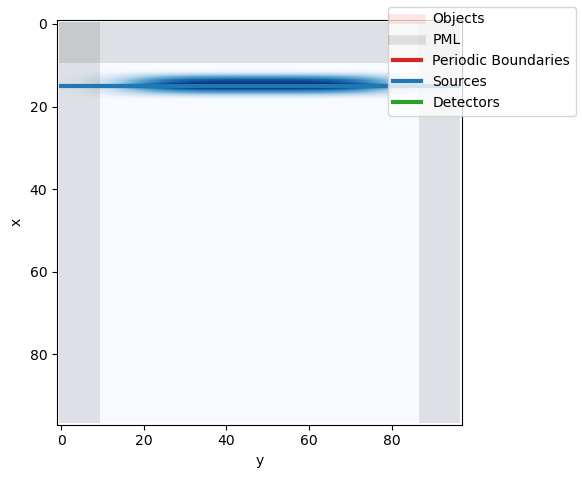

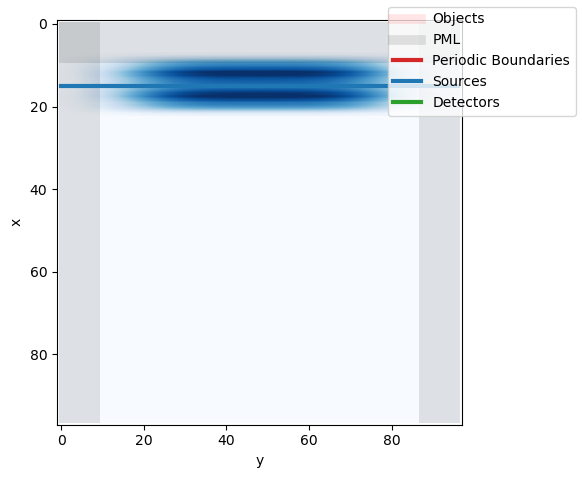

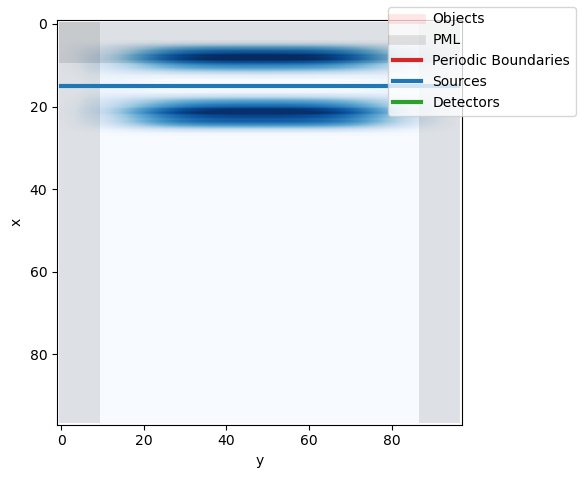

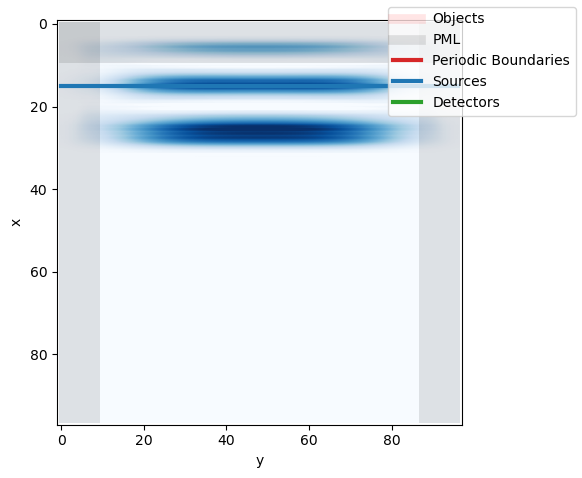

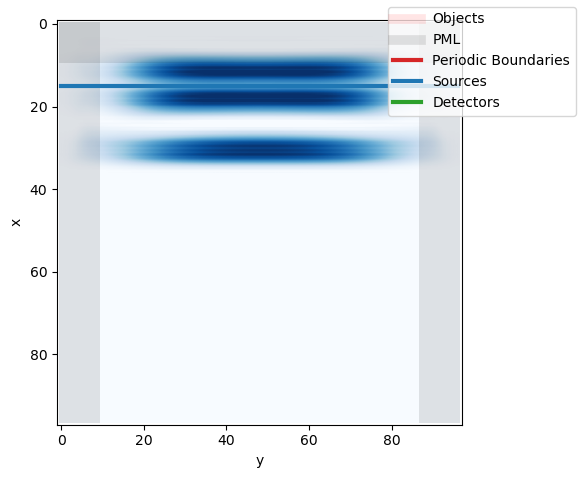

...

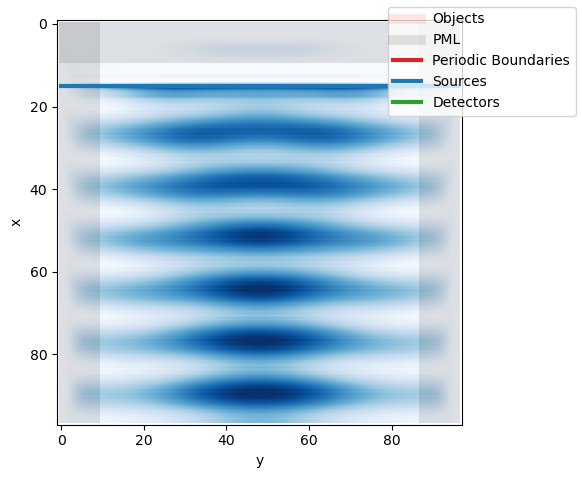

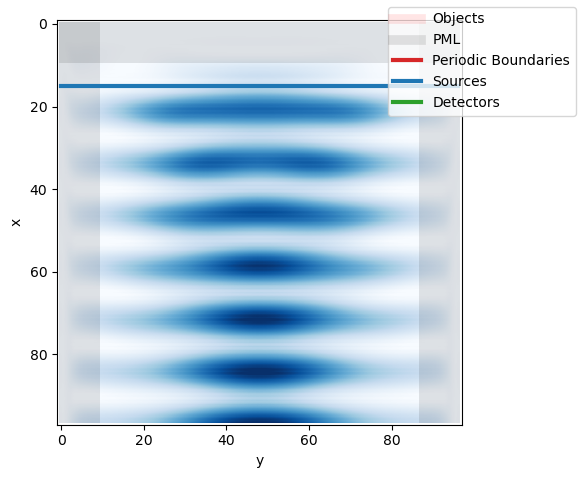

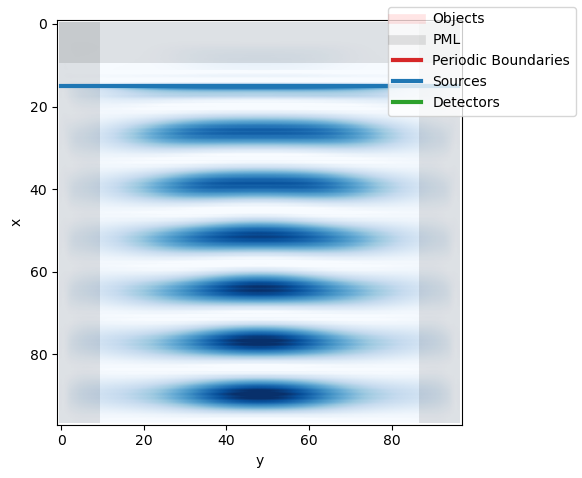

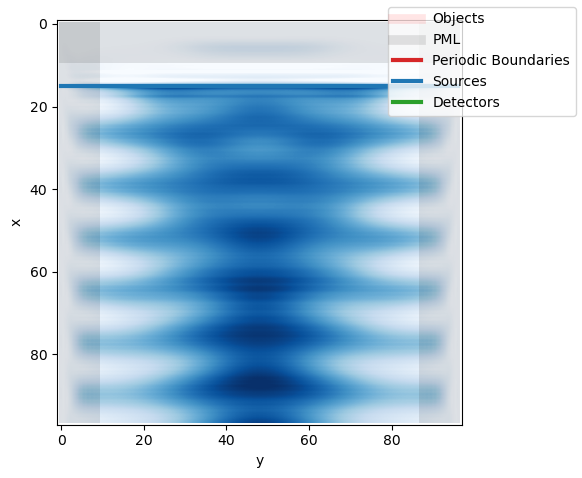

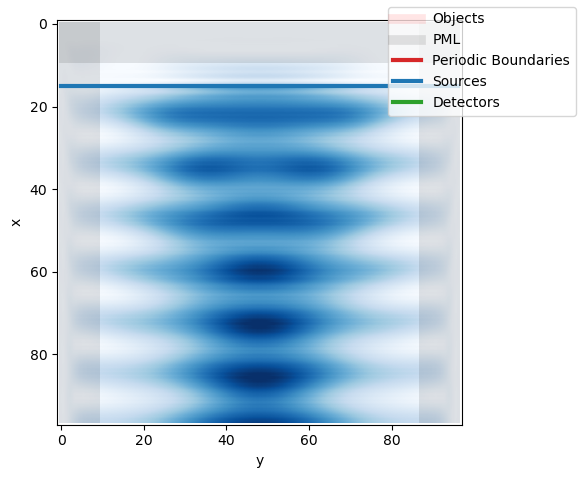

In [15]:
for i in range(100):
    grid.run(10, progress_bar=False)
    grid.visualize(z=0, animate=True)

## Visualization

In [35]:
def visnorm(x, width=3):
    # Produce a standard normal distribution
    mean = x.mean()
    sigma = x.std()
    z = (x-mean)/sigma
    # Map standard normal to [0-1]
    z_map = (z + width)/(2*width)
    # Clip to [0,1]
    z_map = z_map*(z_map > 0)
    z_map = z_map*(z_map < 1) + (z_map > 1)
    return z_map

    


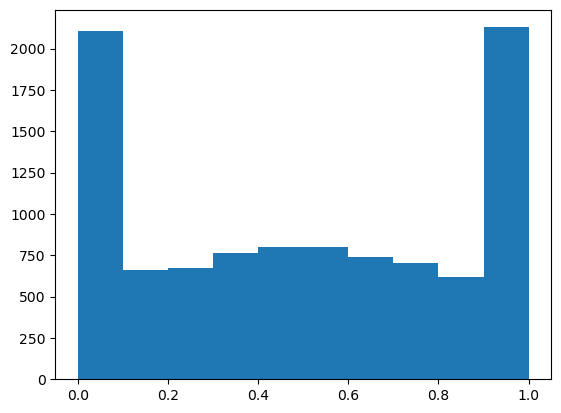

In [48]:
import numpy as np
x = np.random.randn(10000)*np.random.rand(1)*100

width = 1
# Produce a standard normal distribution
mean = x.mean()
sigma = x.std()
z = (x-mean)/sigma
# Map standard normal to [0-1]
z_map = (z + width)/(2*width)
# Clip to [0,1]
z_map = z_map*(z_map > 0)
z_map = z_map*(z_map < 1) + (z_map > 1)
plt.hist(z_map)
plt.show()

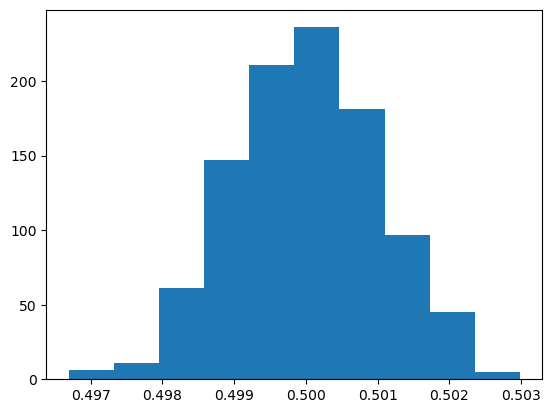

In [29]:
#plt.hist(x)

plt.show()

# 2D - DTFT

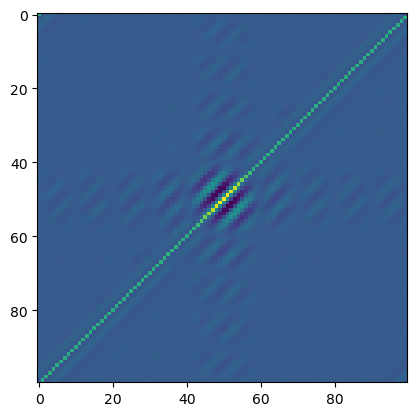

In [68]:
# Make a dummy image
img = np.zeros((100,100))
img = np.eye(100,100)
img[10:20, 10:20] = 1
img_fft = np.fft.fft2(img)
plt.imshow(np.real(np.fft.fftshift(img_fft)))
#plt.imshow(img)
#plt.hist(np.real(np.fft.fftshift(img_fft))[...,0])
plt.show()

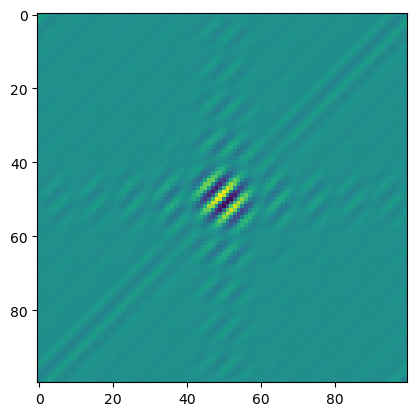

In [72]:
plt.imshow(np.imag(np.fft.fftshift(img_fft)))
plt.show()

In [73]:
img_fft[0,0]

(190+0j)

In [74]:
img_fft[-1,-1]

(-21.741441509067396+84.67732397331571j)

(array([   9.,   10.,   23.,   55., 4998., 4808.,   55.,   23.,   10.,
           9.]),
 array([-8.46773240e+01, -6.77418592e+01, -5.08063944e+01, -3.38709296e+01,
        -1.69354648e+01,  1.42108547e-14,  1.69354648e+01,  3.38709296e+01,
         5.08063944e+01,  6.77418592e+01,  8.46773240e+01]),
 <BarContainer object of 10 artists>)

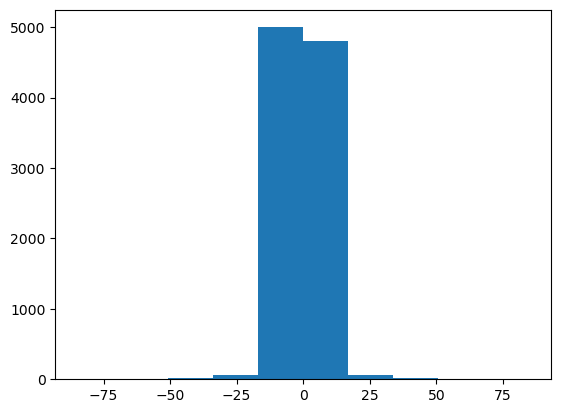

In [79]:
plt.hist(np.imag(img_fft).flatten())

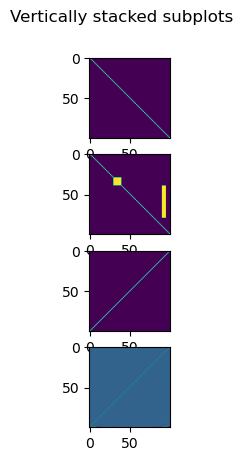

In [110]:
# Compare the imaginary component of two images
# Make a dummy image
img1 = np.eye(100,100)
img2 = np.eye(100,100)
img2[30:40, 30:40] = 1
img2[40:80, 90:95] = 1
img1_fft = np.fft.fft2(img1)
img2_fft = np.fft.fft2(img2)
fig, axs = plt.subplots(4)
fig.suptitle('Vertically stacked subplots')
axs[0].imshow(img1)
axs[1].imshow(img2)
axs[2].imshow(np.real(img1_fft))
axs[3].imshow(np.real(img2_fft))
#axs[1].imshow(np.imag(img1_fft))
#print(np.imag(img1_fft))
#print(np.imag(img2_fft))

In [95]:
np.imag(img2_fft)

array([[ 0.00000000e+00, -3.07768354e+00,  3.07768354e+00,
        -7.26542528e-01, -7.26542528e-01,  1.11022302e-16,
         7.26542528e-01,  7.26542528e-01, -3.07768354e+00,
         3.07768354e+00],
       [-3.07768354e+00,  4.97979657e+00, -3.66546879e+00,
         9.51056516e-01, -1.66533454e-16,  1.17557050e+00,
        -1.90211303e+00,  5.87785252e-01,  9.51056516e-01,
         2.22044605e-16],
       [ 3.07768354e+00, -3.66546879e+00,  1.90211303e+00,
         1.11022302e-16,  2.24513988e-01, -1.90211303e+00,
         2.48989828e+00, -1.17557050e+00,  0.00000000e+00,
        -9.51056516e-01],
       [-7.26542528e-01,  9.51056516e-01,  0.00000000e+00,
        -4.49027977e-01, -5.87785252e-01,  1.90211303e+00,
        -1.67759904e+00, -5.55111512e-17,  1.17557050e+00,
        -5.87785252e-01],
       [-7.26542528e-01,  1.11022302e-16,  2.24513988e-01,
        -5.87785252e-01,  1.17557050e+00, -1.17557050e+00,
        -1.11022302e-16,  1.67759904e+00, -2.48989828e+00,
         1.

In [139]:
def toy_img(img):
    x, y, b, s = np.random.rand(4)
    max_size = 25
    min_size = 8
    s = int(min_size + s*(max_size - min_size))
    x = int(x*img.shape[-1])
    y = int(y*img.shape[-2])
    #print(x,y,b)
    img[..., x:x+s, y:y+s] = b
    return img
    

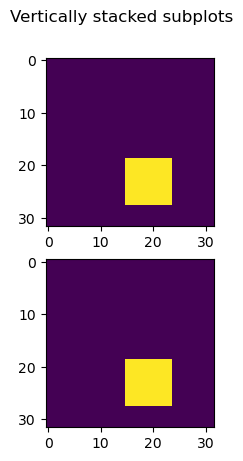

In [147]:

img1 = np.zeros((1,3,32,32))
img2 = toy_img(img1)
fig, axs = plt.subplots(2)
fig.suptitle('Vertically stacked subplots')
axs[0].imshow(img1[0,0,...])
axs[1].imshow(img2[0,0,...])
